# Ohio CAI ~~Snark~~ Review
Double the snark half the work!

My friend from the internet had another list of CAI's... I can't imagine what is about to go wrong.

Interactive: [![Binder](https://mybinder.org/badge_logo.svg)](https://mybinder.org/v2/gh/npappin-wsu/kansasCAI/HEAD?labpath=2.1-ohioAnalysis.ipynb)


In [113]:
import pathlib, itables, pygris, numpy, folium, matplotlib, mapclassify, requests, json, zipfile, io, h3pandas
import pandas as pd
import geopandas as gpd
from pprint import pprint

itables.options.style = 'float:left;width:auto'

## Let's take a look

Time to crack open the list.

In [114]:
cai = pd.read_csv(pathlib.Path('data', '2023-09-21-Ohio-cai.csv'))

In [115]:
itables.show(cai)

Lame! Let's just drop it in a map really quick: [here](https://felt.com/map/Ohio-CAI-Review-Ys4OGeSfT9AK5Qffv78IhwD?loc=46.70721,-117.11435,14z&share=1) HT: Felt.com

Let's start to dig into the actual data. It's GEO TIME!!!

In [116]:
cai = gpd.GeoDataFrame(cai, geometry=gpd.points_from_xy(cai.longitude, cai.latitude), crs='EPSG:4326')

In [117]:
cai

,type,entity_name,entity_number,CMS number,frn,location_id,address_primary,city,state,zip_code,longitude,latitude,explanation,need,availability,geometry
0,S,ANTIOCH UNIVERSITY-MIDWEST,NaN,NaN,NaN,1.005386e+09,900 DAYTON ST,YELLOW SPRINGS,OH,45387,-83.908684,39.803207,NaN,NaN,1000.0,POINT (-83.90868 39.80321)
1,S,ANTIOCH UNIVERSITY-PHD PROGRAM IN LEADERSHIP A...,NaN,NaN,NaN,1.005386e+09,900 DAYTON STREET,YELLOW SPRINGS,OH,45387,-83.892194,39.798627,NaN,NaN,1000.0,POINT (-83.89219 39.79863)
2,S,ANTIOCH UNIVERSITY-SYSTEM ADMINISTRATION,NaN,NaN,NaN,1.005386e+09,900 DAYTON STREET,YELLOW SPRINGS,OH,45387,-83.892154,39.798614,NaN,NaN,1000.0,POINT (-83.89215 39.79861)
3,S,ART ACADEMY OF CINCINNATI,NaN,NaN,NaN,1.317730e+09,1212 JACKSON STREET,CINCINNATI,OH,45202,-84.513913,39.108805,NaN,NaN,1000.0,POINT (-84.51391 39.10881)
4,S,ASHLAND UNIVERSITY,NaN,NaN,NaN,1.002197e+09,401 COLLEGE AVENUE,ASHLAND,OH,44805,-82.320279,40.861616,NaN,NaN,1000.0,POINT (-82.32028 40.86162)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18426,P,The Hancock Metropolitan Housing Authority,NaN,NaN,NaN,NaN,1800 North Blanchard Street,Findlay,OH,45840,-83.642657,41.061647,NaN,NaN,NaN,POINT (-83.64266 41.06165)
18427,P,Trumbull Metropolitan Housing Authority,NaN,NaN,NaN,NaN,4076 Youngstown Rd. SE,Warren,OH,44484,-80.771573,41.215233,NaN,NaN,NaN,POINT (-80.77157 41.21523)
18428,P,Tuscarawas Metropolitan Housing Authority,NaN,NaN,NaN,NaN,134 2nd St SW,New Philadelphia,OH,44663,-81.448447,40.488994,NaN,NaN,NaN,POINT (-81.44845 40.48899)
18429,P,HUD Cleveland Field Office,NaN,NaN,NaN,NaN,1001 Lakeside Avenue,Cleveland,OH,44114,-81.691031,41.507277,NaN,NaN,NaN,POINT (-81.69103 41.50728)


There are a bunch of CAI's that don't have geodata/locationIds. So we are going to filter them now but they will be in the naughtyCai dataframe.

Well nevermind we have two different things, sometimes they have point data and no locationId and the opposite is also true... so actually we have four things...

In [118]:
naughtyCais = cai[(cai['location_id'].isna()) & (cai.geometry.is_empty)]
cai = cai[((cai['location_id'].isna()) & (cai.geometry.is_empty)) == False]
lostCais = cai[cai.geometry.is_empty]
cai = cai[cai.geometry.is_empty == False]
spookyCais = cai[cai['location_id'].isna()]
cai = cai[cai['location_id'].isna() == False]

Let's take a look at the naughty naughty CAIs. These don't have a location_id or a lat/long.

K-State, what are you doing over there? 😉

In [119]:
itables.show(naughtyCais)

Now lets take a look at spooky CAIs. These are places without location_ids so they are both here and not here. 👻

In [120]:
itables.show(spookyCais)

Write something funny here.

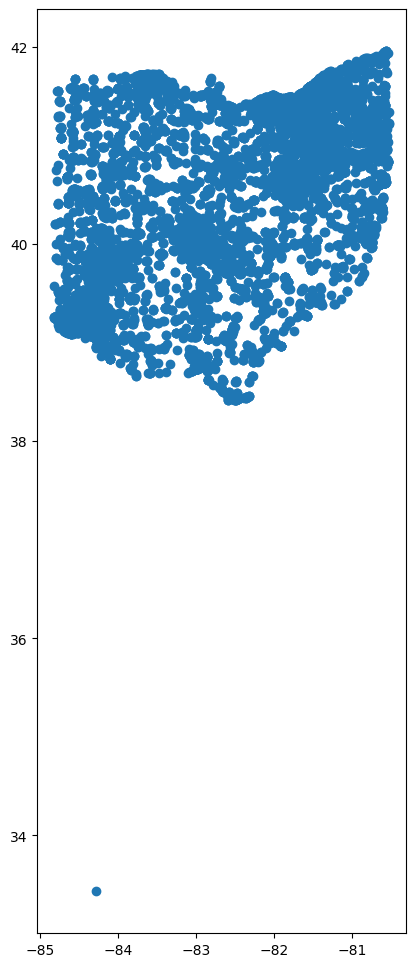

In [121]:
ax = cai.plot(figsize=(12, 12))

Well that looks like Ohio-ish. Except for that one dot. Let's take a quick peek.

In [122]:
cai.explore()

That's ugly... let's add color.

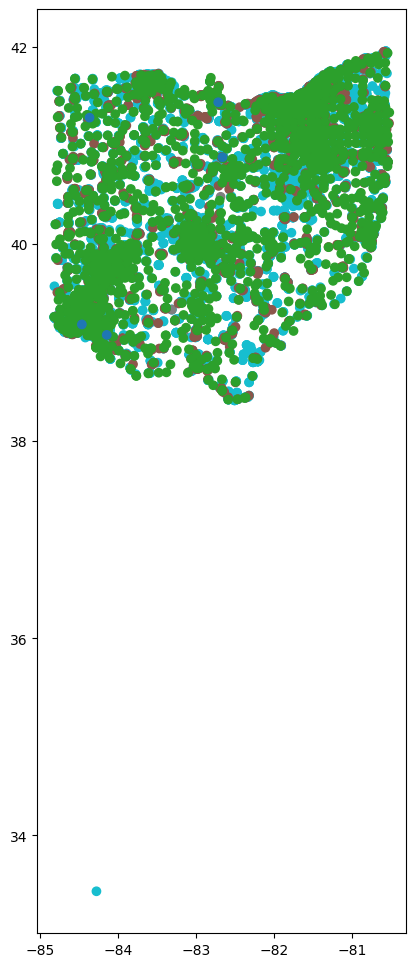

In [123]:
ax = cai.plot(column='type', figsize=(12,12))

But what if we looked at the city?

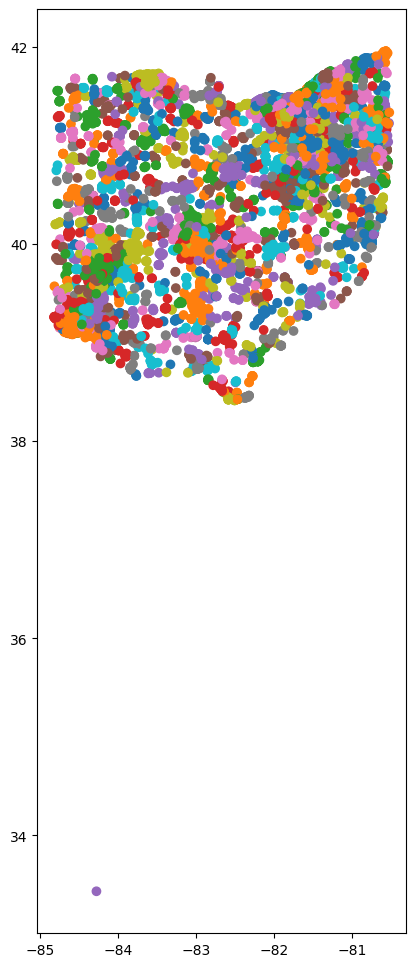

In [124]:
ax = cai.plot(column='city', figsize=(12,12))

Yeah that doesnt say much. Let's go grab some other data.

## The Data Part

Let's grab some availability data!

In [125]:
s = requests.Session()
s.headers.update({'User-Agent': 'j23servedAnalysis/0.0.1'})
url = 'https://broadbandmap.fcc.gov/nbm/map/api/published/filing'
response = s.get(url, timeout=5)
response
parsed = json.loads(response.text)
uuid = parsed['data'][1]['process_uuid']
pprint(parsed['data'][1])
pprint(uuid)
url = f"https://broadbandmap.fcc.gov/nbm/map/api/national_map_process/nbm_get_data_download/{uuid}/"
response = s.get(url, timeout=5)
parsed = json.loads(response.text)
filingData = pd.DataFrame(parsed['data'])
subsetAvalibility = filingData[(filingData.state_name == 'Ohio') & (filingData.file_type == 'csv')].reset_index()

{'enable_bfm_link': True,
 'enable_challenge_download': True,
 'filing_subtype': 'December 31, 2022',
 'filing_type': 'Biannual',
 'filing_type_id': 100006,
 'process_uuid': '34df4f3e-0800-473e-8400-d1682618d5c7'}
'34df4f3e-0800-473e-8400-d1682618d5c7'


In [126]:
itables.show(subsetAvalibility)

Download Time!

In [127]:
baseUrl = ("https://broadbandmap.fcc.gov/nbm/map/api/getNBMDataDownloadFile/", "/1")

availabilityDf = pd.DataFrame()

columnHints={
    'block_geoid': str
}

for item in subsetAvalibility.to_dict('records'):
    # pprint(item)
    print(item['file_name'])
    # print(url)
    file = pathlib.Path('data', 'fcc-avail', f"{item['file_name']}.zip")
    if file.exists():
        with open(file, 'rb') as f:
            data = f.read()
    else:
        if pathlib.Path(file).parent.exists() == False:
            pathlib.Path(file.parent).mkdir()
        url = f"{baseUrl[0]}{item['id']}{baseUrl[1]}"
        r = s.get(url)
        with open(file, 'wb') as f:
            f.write(r.content)
        data = r.content
    zip = zipfile.ZipFile(io.BytesIO(data))
    df = pd.read_csv(zip.open(zip.filelist[0].filename), dtype=columnHints)
    availabilityDf = pd.concat([availabilityDf, df], ignore_index=True)

bdc_39_Copper_fixed_broadband_D22_01dec2023
bdc_39_Cable_fixed_broadband_D22_01dec2023
bdc_39_FibertothePremises_fixed_broadband_D22_01dec2023
bdc_39_GSOSatellite_fixed_broadband_D22_01dec2023
bdc_39_NGSOSatellite_fixed_broadband_D22_01dec2023
bdc_39_UnlicensedFixedWireless_fixed_broadband_D22_01dec2023
bdc_39_LicensedFixedWireless_fixed_broadband_D22_01dec2023
bdc_39_LBRFixedWireless_fixed_broadband_D22_01dec2023


In [128]:
availabilityDf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33955841 entries, 0 to 33955840
Data columns (total 12 columns):
 #   Column                         Dtype 
---  ------                         ----- 
 0   frn                            int64 
 1   provider_id                    int64 
 2   brand_name                     object
 3   location_id                    int64 
 4   technology                     int64 
 5   max_advertised_download_speed  int64 
 6   max_advertised_upload_speed    int64 
 7   low_latency                    int64 
 8   business_residential_code      object
 9   state_usps                     object
 10  block_geoid                    object
 11  h3_res8_id                     object
dtypes: int64(7), object(5)
memory usage: 3.0+ GB


In [129]:
itables.show(availabilityDf)

Let's build some locations!

In [130]:
locations = availabilityDf[[
    'location_id',
    'block_geoid',
    'h3_res8_id'
]].drop_duplicates().reset_index(drop=True)

In [131]:
itables.show(locations)

Useful things they pull out of the CAI list, number 1: Census Blocks, number 2: Hex IDs.

Let's add those back in!

In [132]:
cai = cai.merge(locations, how='left')

In [133]:
itables.show(cai)

Lets see how our merge did...

In [134]:
cai.block_geoid.isna().value_counts()

block_geoid
True     10254
False     4973
Name: count, dtype: int64

Well lets take a look at how it does across different availability releases...

dec2022:
True     10254
False     4973

jun2023:
True     10721
False     4506

Let's just go with December... I should do some more work and pull in data across all three availability releases.

Lets just take the hopeless CAIs out...

In [135]:
cai.block_geoid.isna()

0         True
1         True
2         True
3         True
4         True
         ...  
15222     True
15223    False
15224     True
15225     True
15226    False
Name: block_geoid, Length: 15227, dtype: bool

In [136]:
hopelessCais = cai[cai.block_geoid.isna()]
cai = cai[cai.block_geoid.isna() == False]

Now let's break apart the hex tiles from Census blocks and count the number of locations in the geographies.

In [137]:
h3Stats = locations.drop(columns=['location_id', 'block_geoid']).value_counts().reset_index()
blockStats = locations.drop(columns=['location_id', 'h3_res8_id']).value_counts().reset_index()

In [138]:
itables.show(h3Stats)

Make h3 geographies! I love hexagons. They are beautiful.

In [139]:
h3Stats = h3Stats.set_index('h3_res8_id').h3.h3_to_geo_boundary().reset_index()

Grab the Census data!

In [140]:
blockData = pygris.blocks(state='OH', cache=True)

Using the default year of 2021
Using FIPS code '39' for input 'OH'


In [141]:
itables.show(blockData)

In [142]:
itables.show(blockStats)

Join in the Census data to the Availability data!

In [143]:
blockstats = gpd.GeoDataFrame(blockStats.merge(blockData, left_on='block_geoid', right_on='GEOID20', how='left'))

KeyboardInterrupt: 

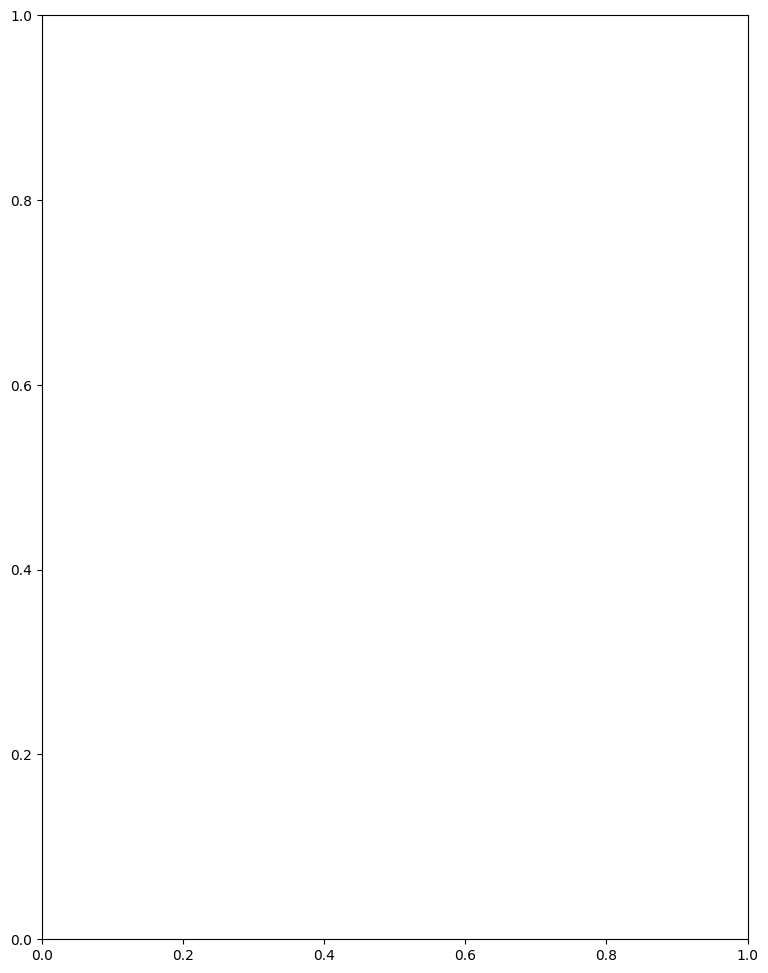

In [144]:
ax = blockstats.plot(figsize=(12,12))

Whew, now that we have data what should we do?

Lets see if we can do an H3 Analysis!

## The H3 Part

In [145]:
itables.show(cai)

In [146]:
h3Stats['centroid'] = h3Stats.to_crs(3857).centroid.to_crs(4326)
h3Stats['boundary'] = h3Stats.geometry
h3Stats = h3Stats.drop(columns=['geometry'])

In [147]:
h3Stats[h3Stats.h3_res8_id == '8826e3d247fffff']

,h3_res8_id,count,centroid,boundary


In [148]:
cai = cai.merge(h3Stats, left_on='h3_res8_id', right_on='h3_res8_id', how='left')
itables.show(cai)

In [149]:
cai['distToH3Center'] = cai.to_crs(3857).distance(cai.set_geometry('centroid').to_crs(3857))

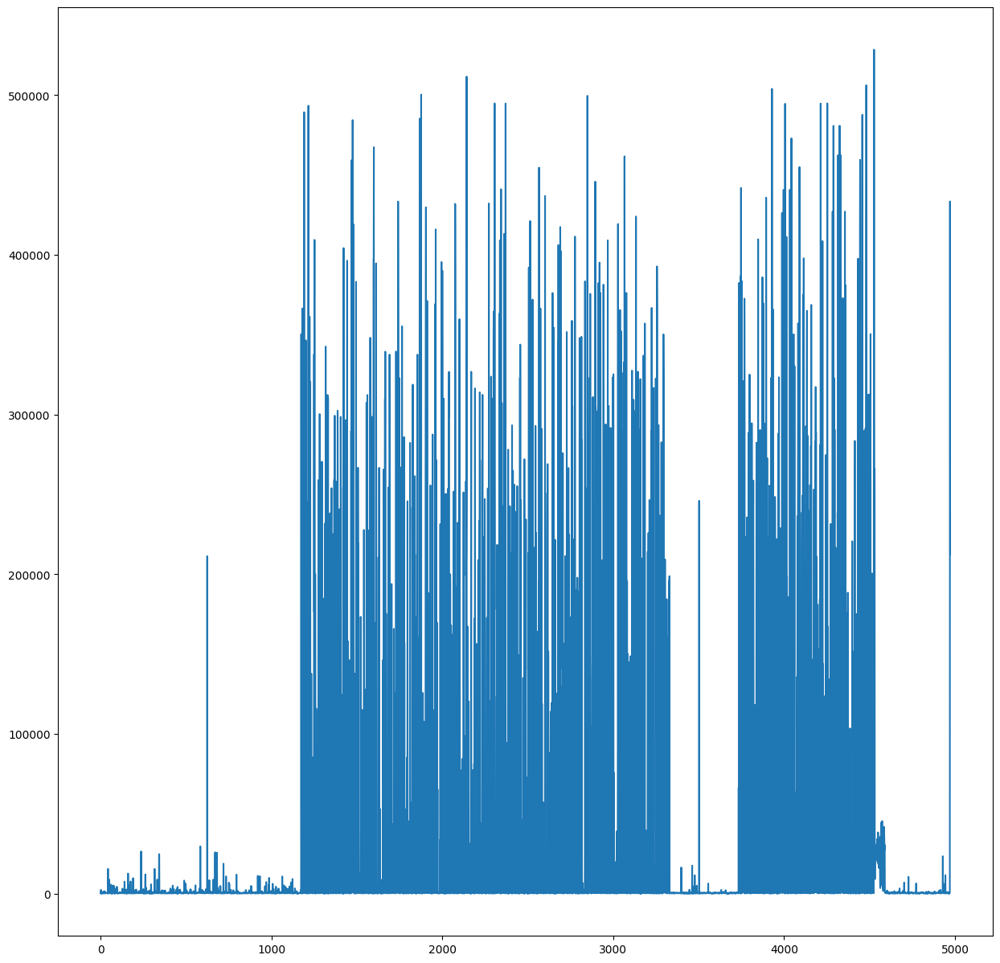

In [150]:
ax = cai.distToH3Center.plot(figsize=(15,15))

In [151]:
cai.sort_values('distToH3Center').tail(5)

,type,entity_name,entity_number,CMS number,frn,location_id,address_primary,city,state,zip_code,...,explanation,need,availability,geometry,block_geoid,h3_res8_id,count,centroid,boundary,distToH3Center
3929,H,BLUE ASH CARE CENTER,NaN,NaN,NaN,1.006600e+09,4900 COOPER ROAD,CINCINNATI,OH,45242,...,NaN,NaN,1000.0,POINT (-84.37475 39.23100),390998109002020,882ab139b7fffff,26,POINT (-80.54866 41.08047),"POLYGON ((-80.54732 41.08504, -80.55357 41.083...",503968.309952
4481,H,"HOUSE OF HOPE CENTER, LLC",NaN,NaN,NaN,1.317769e+09,115 ILLINOIS AVE,YOUNGSTOWN,OH,44505,...,NaN,NaN,NaN,POINT (-80.64418 41.11400),390610232012001,882a93006dfffff,272,POINT (-84.45050 39.21251),"POLYGON ((-84.44958 39.21700, -84.45543 39.215...",506233.318145
2142,S,KINDERCARE LEARNING CENTER NUMBER 877,NaN,NaN,NaN,1.317890e+09,7061 WAYSIDE DRIVE,MENTOR,OH,44060,...,NaN,NaN,NaN,POINT (-81.29827 41.68010),390610046052009,882a930567fffff,254,POINT (-84.39715 39.09551),"POLYGON ((-84.39622 39.09999, -84.40207 39.098...",511612.438873
4527,H,"TRILOGY HEALTHCARE OF HAMILTON III, LLC",NaN,NaN,NaN,1.006091e+09,10460 PROGRESS WAY,HARRISON,OH,45030,...,NaN,NaN,1000.0,POINT (-84.79559 39.26594),390852065002006,882ab02c1bfffff,102,POINT (-81.30584 41.71299),"POLYGON ((-81.30455 41.71760, -81.31086 41.716...",528446.124366
4526,H,"TRILOGY HEALTHCARE OF HAMILTON III, LLC",NaN,NaN,NaN,1.006091e+09,10460 PROGRESS WAY,HARRISON,OH,45030,...,NaN,NaN,1000.0,POINT (-84.79559 39.26540),390852065002006,882ab02c1bfffff,102,POINT (-81.30584 41.71299),"POLYGON ((-81.30455 41.71760, -81.31086 41.716...",528498.312927


Honestly, I am going to stop this analysis now. It really is looking pretty good and generally uninteresting. 

Sad, I was really hoping for another Illinois!

If you have any questions you want me to answer please let me know and I will add them to this analsys. Feel free to open an issue!